# **IMPORT LIBRARIES AND DATASET**

In [84]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math

import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as pyoff

from datetime import datetime

from scipy.stats import skew
from scipy.stats import kurtosis

# Ignores any warning
# import warnings
# warnings.filterwarnings("ignore")

sns.set(rc={'figure.figsize':(15, 8)})
sns.set_style("whitegrid")

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('float_format', '{:f}'.format)

# from matplotlib import rcParams
# rcParams['figure.figsize'] = 12, 4
# rcParams['lines.linewidth'] = 3
# rcParams['xtick.labelsize'] = 'x-large'
# rcParams['ytick.labelsize'] = 'x-large'

import matplotlib as mp
%matplotlib inline
import textwrap
import matplotlib.ticker as mticker
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec

In [85]:
from google.colab import drive
drive.mount('/content/drive')

df = pd.read_csv('/content/drive/MyDrive/data/marketing_campaign_data.csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **DATA PREPARATION**

In [86]:
cat_cols = ['ID', 'Education', 'Marital_Status', 'AcceptedCmp1',
            'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4',
            'AcceptedCmp5', 'Complain', 'Response']

num_cols = ['Year_Birth', 'Income', 'Kidhome', 'Teenhome',
            'Recency', 'MntCoke', 'MntFruits', 'MntMeatProducts',
            'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
            'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
            'NumStorePurchases', 'NumWebVisitsMonth', 'Z_CostContact', 'Z_Revenue']

timestamp = ["Dt_Customer"]

## Handling Missing Values

In [87]:
print('Missing values status:', df.isnull().values.any())
nvc = pd.DataFrame(df.isnull().sum().sort_values(), columns=['Total Null Values'])
nvc['Percentage'] = (nvc['Total Null Values']/df.shape[0])*100
nvc["Data Type"] = [df[col].dtype for col in df.columns]
nvc.sort_values(by=["Total Null Values", "Percentage"], ascending=False, inplace=True)
print(nvc)

Missing values status: True
                     Total Null Values  Percentage Data Type
Income                              24    1.071429     int64
Unnamed: 0                           0    0.000000     int64
Z_CostContact                        0    0.000000     int64
Complain                             0    0.000000     int64
AcceptedCmp2                         0    0.000000    object
AcceptedCmp1                         0    0.000000    object
AcceptedCmp5                         0    0.000000   float64
AcceptedCmp4                         0    0.000000     int64
AcceptedCmp3                         0    0.000000     int64
NumWebVisitsMonth                    0    0.000000    object
NumStorePurchases                    0    0.000000     int64
NumCatalogPurchases                  0    0.000000     int64
NumWebPurchases                      0    0.000000     int64
NumDealsPurchases                    0    0.000000     int64
MntGoldProds                         0    0.000000     in

In [88]:
df.dropna(inplace = True)

## Unique Values

In [89]:
for x in df.columns :
    unq = list(df[x].unique())
    sorted(unq)

    print (f'===== {x} =====')
    if len(unq) >= 10:
        unq = list(unq[:10])+['.....']
        print (f'{unq}')
    else:
        print (f'{unq}')
    print()

===== Unnamed: 0 =====
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, '.....']

===== ID =====
[5524, 2174, 4141, 6182, 5324, 7446, 965, 6177, 4855, 5899, '.....']

===== Year_Birth =====
[1957, 1954, 1965, 1984, 1981, 1967, 1971, 1985, 1974, 1950, '.....']

===== Education =====
['S1', 'S3', 'S2', 'SMA', 'D3']

===== Marital_Status =====
['Lajang', 'Bertunangan', 'Menikah', 'Cerai', 'Janda', 'Duda']

===== Income =====
[58138000.0, 46344000.0, 71613000.0, 26646000.0, 58293000.0, 62513000.0, 55635000.0, 33454000.0, 30351000.0, 5648000.0, '.....']

===== Kidhome =====
[0, 1, 2]

===== Teenhome =====
[0, 1, 2]

===== Dt_Customer =====
['04-09-2012', '08-03-2014', '21-08-2013', '10-02-2014', '19-01-2014', '09-09-2013', '13-11-2012', '08-05-2013', '06-06-2013', '13-03-2014', '.....']

===== Recency =====
[58, 38, 26, 94, 16, 34, 32, 19, 68, 59, '.....']

===== MntCoke =====
[635000, 11000, 426000, 173000, 520000, 235000, 76000, 14000, 28000, 6000, '.....']

===== MntFruits =====
[88000, 1000, 49000, 4000,

## Create 'Dt_Customer' Column

In [90]:
df["Dt_Customer"] = pd.to_datetime(df["Dt_Customer"])

<ipython-input-90-9675b370abb2>:1: UserWarning:

Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.



## Simplifying the 'Marital_Status' Column

In [91]:
df['Marital_Status'] = df['Marital_Status'].replace(['Cerai','Janda', 'Duda'],'Cerai')
df['Marital_Status'] = df['Marital_Status'].replace(['Bertunangan','Menikah'],'Menikah')

## Simplifying the 'Education' Column

In [92]:
df['Education'] = df['Education'].replace(['D3'],'S1')

In [93]:
df.head()

,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,0,5524,1957,S1,Lajang,58138000.000000,0,0,2012-04-09,58,635000,88000,546000,172000,88000,88000,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,1,2174,1954,S1,Lajang,46344000.000000,1,1,2014-08-03,38,11000,1000,6000,2000,1000,6000,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,2,4141,1965,S1,Menikah,71613000.000000,0,0,2013-08-21,26,426000,49000,127000,111000,21000,42000,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,3,6182,1984,S1,Menikah,26646000.000000,1,0,2014-10-02,26,11000,4000,20000,10000,3000,5000,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,4,5324,1981,S3,Menikah,58293000.000000,1,0,2014-01-19,94,173000,43000,118000,46000,27000,15000,5,5,3,6,5,0,0,0,0,0,0,3,11,0


## Checking Outliers

In [94]:
print(f'Jumlah baris: {len(df)}')

outlier = []
no_outlier = []
is_outlier = []
low_lim = []
high_lim = []

filtered_entries = np.array([True] * len(df))
for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    low_limit = Q1 - (IQR * 1.5)
    high_limit = Q3 + (IQR * 1.5)

    filter_outlier = ((df[col] >= low_limit) & (df[col] <= high_limit))
    outlier.append(len(df[~filter_outlier]))
    no_outlier.append(len(df[filter_outlier]))
    is_outlier.append(df[col][~filter_outlier].any())
    low_lim.append(low_limit)
    high_lim.append(high_limit)

    filtered_entries = ((df[col] >= low_limit) & (df[col] <= high_limit)) & filtered_entries

print("Outlier All Data :", len(df[~filtered_entries]))
print("Not Outlier All Data :", len(df[filtered_entries]))
print()

pd.DataFrame({
    "Column Name":num_cols,
    "is Outlier": is_outlier,
    "Lower Limit": low_lim,
    "Upper Limit": high_lim,
    "Outlier":outlier,
    "No Outlier":no_outlier
})

Jumlah baris: 2216
Outlier All Data : 710
Not Outlier All Data : 1506



,Column Name,is Outlier,Lower Limit,Upper Limit,Outlier,No Outlier
0,Year_Birth,True,1932.000000,2004.000000,3,2213
1,Income,True,-14525500.000000,118350500.000000,8,2208
2,Kidhome,False,-1.500000,2.500000,0,2216
3,Teenhome,False,-1.500000,2.500000,0,2216
4,Recency,False,-51.000000,149.000000,0,2216
5,MntCoke,True,-697500.000000,1226500.000000,35,2181
6,MntFruits,True,-44500.000000,79500.000000,246,1970
7,MntMeatProducts,True,-308375.000000,556625.000000,174,2042
8,MntFishProducts,True,-67500.000000,120500.000000,222,1994
9,MntSweetProducts,True,-47000.000000,81000.000000,246,1970


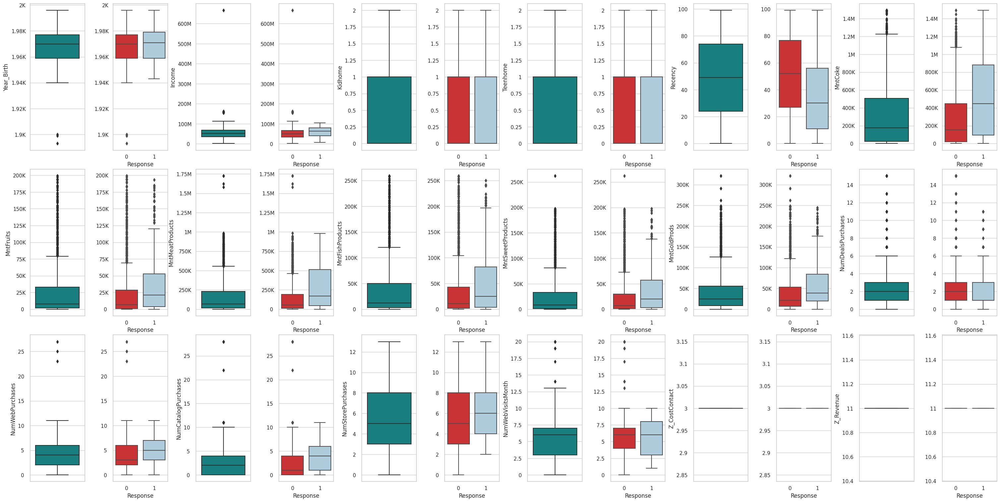

In [95]:
from math import log10, floor
def format_func(value, tick_number=None):
    num_thousands = 0 if abs(value) < 1000 else floor (log10(abs(value))/3)
    value = round(value / 1000**num_thousands, 2)
    return f'{value:g}'+' KMGTPEZY'[num_thousands]

plt.figure(figsize=(30, 15))
n = 3
j = 0

colors=["#e31a1c", "#a6cee3"]

for i in range(0, len(num_cols)*2, 2):
    ax1 = plt.subplot(n, math.ceil(len(num_cols)*2/n), i+1)
    sns.boxplot(y=df[num_cols[j]], color='#088F8F', orient='v')

    ax2 = plt.subplot(n, math.ceil(len(num_cols)*2/n), i+2, sharey=ax1)
    sns.boxplot(x=df["Response"], y=df[num_cols[j]], orient='v', palette=colors)

    ax2.yaxis.set_major_formatter(plt.FuncFormatter(format_func))

    ax2.set_ylabel(None)

    plt.tight_layout(pad=0.1)

    j+=1

# FEATURE ENGINEERING

## Create 'Age' Column

In [96]:
currentYear = 2014 # based on data
df['Age'] = currentYear - df['Year_Birth']

## Create 'Age_group' Column


Will be simplified again:
- Young Adult < 30
- Adult 30-45 years
- Senior Adult > 45 years

In [97]:
def age_group(x):
    if x > 45:
        grup = 'Senior Adult'
    elif x > 30:
        grup = 'Adult'
    else:
        grup = 'Young Adult'

    return grup

df['Age_group'] = df["Age"].apply(lambda x: age_group(x))

## Create ''Has_child' Column


Combines 'Kidhome' and 'Teenhome' into the 'Has_child' feature, which is the sum of those who have at least 1 child.

In [98]:
df['Has_child'] = np.where(df["Kidhome"]+df["Teenhome"] > 0, 1, 0)

##Create 'Dependents' Column


Number of dependents of the customer, from the sum of 'Kidhome' and 'Teenhome'

In [99]:
df['Dependents'] = df['Kidhome'] + df['Teenhome']

## Create 'Lifetime' Column


How many months has it been since your first purchase at the supermarket

In [100]:
df['Lifetime'] = (2014 - df["Dt_Customer"].dt.year)*12 + df["Dt_Customer"].dt.month

## Create 'Spending' Column


Number of purchases per customer on all products

In [101]:
df['Spending']=df['MntCoke']+ \
    df['MntFruits']+ \
    df['MntMeatProducts']+ \
    df['MntFishProducts']+ \
    df['MntSweetProducts']+ \
    df['MntGoldProds']

## Create 'Total_Purchases' Column

In [102]:
df['Total_Purchases'] = df['NumDealsPurchases'] + \
    df['NumWebPurchases'] + \
    df['NumCatalogPurchases'] + \
    df['NumStorePurchases']

## Create ''Total_Cmp' Column


How many times each customer responded to the 5 campaigns implemented (AcceptedCmp 1 - 5)

In [103]:
df['Total_Cmp']=df['AcceptedCmp1'].astype("int64")+ \
    df['AcceptedCmp2'].astype("int64")+ \
    df['AcceptedCmp3'].astype("int64")+ \
    df['AcceptedCmp4'].astype("int64")+ \
    df['AcceptedCmp5'].astype("int64")

In [104]:
df['Ever_Accept']=df['Total_Cmp'].apply(lambda x : 1 if x >= 1 else 0)

In [105]:
# total revenue
df['Total_revenue'] = (df['Total_Cmp']) * df['Z_Revenue']
df[['Z_Revenue', 'Total_revenue']].sample(5)

,Z_Revenue,Total_revenue
1163,11,0
484,11,0
2109,11,11
1140,11,0
966,11,22


## Income Segmentation Column


- None -> Missing values
- High -> >= q3(68468)
- Medium -> q1(35335) - q3(68468)
- Low -> < q1(35335)

In [106]:
Q1 = df["Income"].quantile(.25)
print(Q1)
Q3 = df["Income"].quantile(.75)
print(Q3)

def income_sgmt(x):
    if (x is None) or (type(x) not in [int, float]) :
        segment = "None"
    else:
        if x >= Q3:
            segment = "High"
        elif x < Q3 and x >= Q1:
            segment = "Medium"
        else:
            segment = "Low"
    return segment

df["Income_sgmt"] = df["Income"].fillna("None")
df["Income_sgmt"] = df["Income_sgmt"].apply(lambda x: income_sgmt(x))

35303000.0
68522000.0


## Conversion Rate

In [107]:
df['Conversion_rate_web'] = np.round(df['Total_Purchases'] / df['NumWebVisitsMonth'], 2)
df['Conversion_rate_web'].fillna(0, inplace=True)
df['Conversion_rate_web'].replace([np.inf, -np.inf], 0, inplace=True)

## Month Joined

In [108]:
df['Month_joined'] = df['Dt_Customer'].dt.month

## Recency Segmentation

In [109]:
np.sort(df['Recency'].unique())

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])

In [110]:
num_score = 5
cek = pd.qcut(df['Recency'].unique(), num_score, labels=range(num_score, 0, -1))
cek = pd.DataFrame({
    "value":df['Recency'].unique(),
    "score": cek
})

cek.groupby(['score'])[['value']] \
    .agg(['min', 'max']).sort_index(ascending=False) \
    .style.background_gradient(cmap='Reds')

In [111]:
divided = {5: 19, 4: 39, 3: 59, 2: 79}

def RScore(x,d):
    if x <= d[5]:
        return 4
    elif x <= d[4]:
        return 3
    elif x <= d[3]:
        return 2
    elif x <= d[2]:
        return 1
    else:
        return 0

df['Recency_sgmt'] = df['Recency'].apply(lambda x: RScore(x, divided))
df.groupby(['Recency_sgmt'])[['Recency']].agg(['min', 'max', 'count']).style.background_gradient(cmap='Reds')

### Result

In [112]:
df.sample(5)

,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Age_group,Has_child,Dependents,Lifetime,Spending,Total_Purchases,Total_Cmp,Ever_Accept,Total_revenue,Income_sgmt,Conversion_rate_web,Month_joined,Recency_sgmt
514,514,182,1946,S3,Menikah,44124000.000000,0,1,2013-11-05,62,284000,0,55000,0,6000,52000,4,6,2,5,8,0,0,0,0,0,0,3,11,0,68,Senior Adult,1,1,23,397000,17,0,0,0,Medium,2.120000,11,1
1917,1917,4385,1981,S3,Lajang,36038000.000000,1,0,2013-05-31,82,23000,0,15000,0,2000,7000,2,3,0,3,6,0,0,0,0,0,0,3,11,0,33,Adult,1,1,17,47000,8,0,0,0,Medium,1.330000,5,0
1965,1965,6203,1947,S1,Menikah,74485000.000000,0,0,2013-08-24,58,499000,149000,815000,173000,49000,49000,1,6,7,12,3,0,0,0,0,0,0,3,11,0,67,Senior Adult,0,0,20,1734000,26,0,0,0,High,8.670000,8,2
2146,2146,1818,1971,S3,Menikah,29732000.000000,1,0,2014-03-25,23,25000,0,8000,0,1000,4000,1,2,0,2,9,0,0,0,0,0,0,3,11,0,43,Adult,1,1,3,38000,5,0,0,0,Low,0.560000,3,3
1952,1952,3434,1951,S1,Lajang,80872000.000000,0,0,2014-12-05,60,483000,72000,567000,94000,12000,108000,1,4,4,10,1,0,0,0,0,0,0,3,11,0,63,Senior Adult,0,0,12,1336000,19,0,0,0,High,19.000000,12,1


In [113]:
cat_str = ['Education', 'Marital_Status', 'Age_group', 'Income_sgmt']
cat_int = ['ID', 'Kidhome', 'Teenhome', 'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
           'Ever_Accept', 'Complain', 'Response', 'Has_child', 'Recency_sgmt']

num = ['Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'Age', 'Dependents', 'Lifetime', 'Spending',
        'Total_Purchases', 'NumWebVisitsMonth', 'Conversion_rate_web', 'Total_Cmp']

num_one = ['Z_CostContact', 'Z_Revenue']

num_product = ['MntCoke', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
num_purchases = ['NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases']

timestamp = ["Dt_Customer"]

In [114]:
allcol = cat_str + cat_int + num + num_one + num_product + num_purchases + timestamp
for i in df:
    if i not in allcol:
        print(i)

Unnamed: 0
Total_revenue
Month_joined


In [115]:
#cek unique value
cat_cols = cat_str+cat_int
for x in cat_cols:
    unq = list(df[x].unique())
    sorted(unq)

    print (f'===== {x} =====')
    if len(unq) >= 10:
        unq = list(unq[:10])+['.....']
        print (f'{unq}')
    else:
        print (f'{unq}')
    print()

num_cols = num + num_one + num_product + num_purchases
for x in num_cols + timestamp:
    print("{} = {} - {}".format(x, min(df[x]), max(df[x])))

===== Education =====
['S1', 'S3', 'S2', 'SMA']

===== Marital_Status =====
['Lajang', 'Menikah', 'Cerai']

===== Age_group =====
['Senior Adult', 'Young Adult', 'Adult']

===== Income_sgmt =====
['Medium', 'High', 'Low']

===== ID =====
[5524, 2174, 4141, 6182, 5324, 7446, 965, 6177, 4855, 5899, '.....']

===== Kidhome =====
[0, 1, 2]

===== Teenhome =====
[0, 1, 2]

===== AcceptedCmp1 =====
[0, 1]

===== AcceptedCmp2 =====
[0, 1]

===== AcceptedCmp3 =====
[0, 1]

===== AcceptedCmp4 =====
[0, 1]

===== AcceptedCmp5 =====
[0, 1]

===== Ever_Accept =====
[0, 1]

===== Complain =====
[0, 1]

===== Response =====
[1, 0]

===== Has_child =====
[0, 1]

===== Recency_sgmt =====
[2, 3, 0, 4, 1]

Year_Birth = 1893 - 1996
Income = 1730000.0 - 666666000.0
Kidhome = 0 - 2
Teenhome = 0 - 2
Recency = 0 - 99
Age = 18 - 121
Dependents = 0 - 3
Lifetime = 1 - 36
Spending = 5000 - 2525000
Total_Purchases = 0 - 44
NumWebVisitsMonth = 0 - 20
Conversion_rate_web = 0.0 - 43.0
Total_Cmp = 0 - 4
Z_CostContact

In [116]:
new_cols = list(df.columns.values)
new_cols.remove("Response")
new_cols.append("Response")
df = df[new_cols].copy()

In [117]:
df.columns

Index(['Unnamed: 0', 'ID', 'Year_Birth', 'Education', 'Marital_Status',
       'Income', 'Kidhome', 'Teenhome', 'Dt_Customer', 'Recency', 'MntCoke',
       'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Age',
       'Age_group', 'Has_child', 'Dependents', 'Lifetime', 'Spending',
       'Total_Purchases', 'Total_Cmp', 'Ever_Accept', 'Total_revenue',
       'Income_sgmt', 'Conversion_rate_web', 'Month_joined', 'Recency_sgmt',
       'Response'],
      dtype='object')

# **FEATURE TRANSFORMATION**

In [118]:
skew_type_list = []
skew_val_list = []
kurtosis_val_list = []

for column in num_cols:
    data = df[column].dropna(axis=0)
    q1 = data.quantile(q=0.25)
    mean = round(data.mean(), 3)
    median = data.median()
    mode = data.mode()[0]
    q3 = data.quantile(q=0.75)
    # skew_val = round(data.skew(),3)
    skew_val = round(skew(data, nan_policy="omit"),3)
    kurtosis_val = round(kurtosis(data, nan_policy="omit"),3)

    if (mean == median == mode) or (-0.2 < skew_val < 0.2):
        skew_type = "Normal Distribution (Symmetric)"
    elif mean < median < mode:
        skew_type = "Negatively Skewed"
        if skew_val <= -1:
            skew_type = "Highly Negatively Skewed"
        elif -0.5 >= skew_val > -1:
            skew_type = "Moderately Negatively Skewed"
        else :
            skew_type = "Moderately Normal Distribution (Symmetric)"
    else:
        skew_type = "Positively Skewed"
        if skew_val >= 1:
            skew_type = "Highly Positively Skewed"
        elif 0.5 <= skew_val < 1:
            skew_type = "Moderately Positively Skewed"
        else :
            skew_type = "Moderately Normal Distribution (Symmetric)"
    skew_type_list.append(skew_type)
    skew_val_list.append(skew_val)
    kurtosis_val_list.append(kurtosis_val)

dist = pd.DataFrame({
    "Column Name":num_cols,
    "Skewness": skew_val_list,
    "Kurtosis": kurtosis_val_list,
    "Type of Distribution": skew_type_list
})

# for bimodial and Uniform

dist.loc[dist["Column Name"].isin(["Z_CostContact", "Z_Revenue"]), "Type of Distribution"] = "Uniform Distribution"
dist.loc[dist["Column Name"].isin(["Kidhome", "Teenhome"]), "Type of Distribution"] = "Bimodal Distribution"
dist = dist.sort_values(["Type of Distribution","Column Name"]).reset_index(drop=True)
dist

<ipython-input-118-fcf9bb379856>:13: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.

<ipython-input-118-fcf9bb379856>:14: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.

<ipython-input-118-fcf9bb379856>:13: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.

<ipython-input-118-fcf9bb379856>:14: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.



,Column Name,Skewness,Kurtosis,Type of Distribution
0,Kidhome,0.635000,-0.792000,Bimodal Distribution
1,Teenhome,0.407000,-0.990000,Bimodal Distribution
2,Conversion_rate_web,2.324000,6.429000,Highly Positively Skewed
3,Income,6.759000,159.274000,Highly Positively Skewed
4,MntCoke,1.170000,0.579000,Highly Positively Skewed
5,MntFishProducts,1.915000,3.067000,Highly Positively Skewed
6,MntFruits,2.100000,4.042000,Highly Positively Skewed
7,MntGoldProds,1.838000,3.147000,Highly Positively Skewed
8,MntMeatProducts,2.024000,5.041000,Highly Positively Skewed
9,MntSweetProducts,2.102000,4.094000,Highly Positively Skewed


In [119]:
exclude = ["Kidhome", "Teenhome", "Dependents", "Total_Cmp"]

log_cols = sorted(list(dist[
    dist["Type of Distribution"].str.contains("Positively Skewed") &
    ~dist["Column Name"].isin(exclude)
]["Column Name"].values))

norm_cols = sorted(list(dist[
    dist["Type of Distribution"].str.contains("Normal Distribution") &
    ~dist["Column Name"].isin(exclude)
]["Column Name"].values))

print("Log Transformation =", log_cols)
print("Normalisasi/Standardization =", norm_cols)

Log Transformation = ['Conversion_rate_web', 'Income', 'MntCoke', 'MntFishProducts', 'MntFruits', 'MntGoldProds', 'MntMeatProducts', 'MntSweetProducts', 'NumCatalogPurchases', 'NumDealsPurchases', 'NumStorePurchases', 'NumWebPurchases', 'Spending']
Normalisasi/Standardization = ['Age', 'Lifetime', 'NumWebVisitsMonth', 'Recency', 'Total_Purchases', 'Year_Birth']


## Yeo-Johnson Transformation

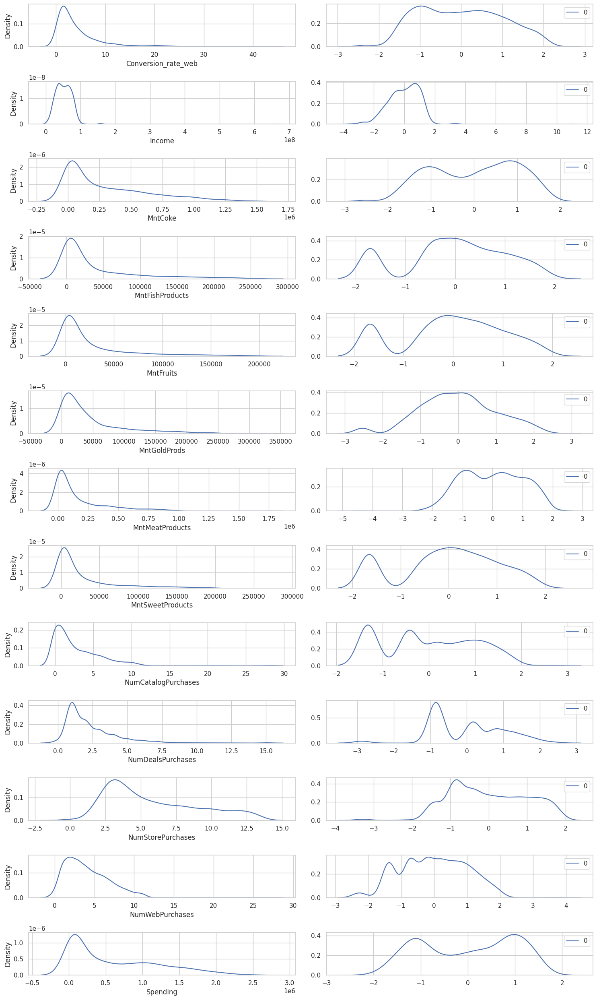

In [120]:
from sklearn.preprocessing import PowerTransformer

fig, ax = plt.subplots(len(log_cols),2,figsize=(15,25))
for i in range(0,len(log_cols)):
    pt = PowerTransformer(method='yeo-johnson')
    data = pt.fit_transform(df[[log_cols[i]]]+1)
    kde1 = sns.kdeplot(df[log_cols[i]], ax=ax[i][0])
    kde2 = sns.kdeplot(data, ax=ax[i][1])
    kde2.set_ylabel(None)
    plt.tight_layout()

In [121]:
pt = PowerTransformer(method='yeo-johnson')
df[log_cols] = pt.fit_transform(df[log_cols])

In [122]:
df[log_cols].describe()

,Conversion_rate_web,Income,MntCoke,MntFishProducts,MntFruits,MntGoldProds,MntMeatProducts,MntSweetProducts,NumCatalogPurchases,NumDealsPurchases,NumStorePurchases,NumWebPurchases,Spending
count,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000
mean,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000
std,1.000226,1.000226,1.000226,1.000226,1.000226,1.000226,1.000226,1.000226,1.000226,1.000226,1.000226,1.000226,1.000226
min,-2.611759,-3.697484,-2.533205,-1.720189,-1.685619,-2.549298,-4.646822,-1.660693,-1.341311,-3.035454,-3.432964,-2.353059,-2.105570
25%,-0.846000,-0.676758,-0.893292,-0.463729,-0.446168,-0.654121,-0.825004,-0.625354,-1.341311,-0.824092,-0.866535,-0.715666,-0.977990
50%,-0.022237,0.084728,0.114558,0.048527,0.055702,-0.024795,0.026960,0.066971,0.154727,0.159380,-0.046750,0.180752,0.130624
75%,0.758112,0.765312,0.865328,0.752436,0.732397,0.635830,0.827257,0.725240,0.796675,0.747062,0.806670,0.824615,0.915934
max,2.364822,10.944883,1.835490,1.865436,1.913013,2.607371,2.304880,2.076318,2.772727,2.656468,1.776553,3.999792,1.755302


## Normalization

In [123]:
from sklearn.preprocessing import MinMaxScaler
# create a scaler object
scaler = MinMaxScaler()
# fit and transform the data
df[norm_cols] = pd.DataFrame(scaler.fit_transform(df[norm_cols]), columns=df[norm_cols].columns)

In [124]:
df[norm_cols].describe()

,Age,Lifetime,NumWebVisitsMonth,Recency,Total_Purchases,Year_Birth
count,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000
mean,0.263982,0.489597,0.265595,0.495627,0.338422,0.736018
std,0.116319,0.287085,0.121458,0.292347,0.174398,0.116319
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.184466,0.314286,0.150000,0.242424,0.181818,0.640777
50%,0.252427,0.485714,0.300000,0.494949,0.340909,0.747573
75%,0.359223,0.657143,0.350000,0.747475,0.477273,0.815534
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# **FEATURE ENCODING**

In [125]:
df

,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Age,Age_group,Has_child,Dependents,Lifetime,Spending,Total_Purchases,Total_Cmp,Ever_Accept,Total_revenue,Income_sgmt,Conversion_rate_web,Month_joined,Recency_sgmt,Response
0,0,5524,0.621359,S1,Lajang,0.365734,0,0,2012-04-09,0.585859,1.051500,1.324828,1.429830,1.552432,1.298176,1.062647,0.747062,1.335345,1.725758,-0.419456,0.350000,0,0,0,0,0,0,3,11,0.378641,Senior Adult,0,0,0.771429,1.313280,0.568182,0,0,0,Medium,0.321583,4,2,1
1,1,2174,0.592233,S1,Lajang,-0.137976,1,1,2014-08-03,0.383838,-1.183662,-0.650001,-1.351599,-0.588001,-0.625354,-0.865322,0.159380,-1.363295,-0.378510,-1.428511,0.250000,0,0,0,0,0,0,3,11,0.407767,Senior Adult,1,2,0.200000,-1.443495,0.136364,0,0,0,Medium,-0.862954,8,3,0
2,2,4141,0.699029,S1,Menikah,0.877869,0,0,2013-08-21,0.262626,0.733018,0.957470,0.424657,1.245391,0.495487,0.389482,-0.824092,1.335345,0.154727,1.241906,0.200000,0,0,0,0,0,0,3,11,0.300971,Senior Adult,0,0,0.542857,0.658297,0.477273,0,0,0,High,0.729316,8,3,0
3,3,6182,0.883495,S1,Menikah,-1.166848,1,0,2014-10-02,0.262626,-1.183662,-0.212388,-0.699631,-0.027449,-0.294167,-0.953176,0.159380,-0.715666,-1.341311,-0.419456,0.300000,0,0,0,0,0,0,3,11,0.116505,Young Adult,1,1,0.257143,-1.116932,0.181818,0,0,0,Low,-0.756467,10,3,0
4,4,5324,0.854369,S3,Menikah,0.371969,1,0,2014-01-19,0.949495,0.109151,0.881150,0.376879,0.705400,0.620765,-0.353802,1.445810,0.524119,0.520254,0.273669,0.250000,0,0,0,0,0,0,3,11,0.145631,Adult,1,1,0.000000,0.176959,0.431818,0,0,0,Medium,0.389065,1,0,0
5,5,7446,0.718447,S2,Menikah,0.538411,0,1,2013-09-09,0.161616,0.888597,0.867609,0.257339,-1.720189,0.856252,-0.396763,0.159380,0.824615,0.796675,1.241906,0.300000,0,0,0,0,0,0,3,11,0.281553,Senior Adult,1,1,0.571429,0.591637,0.500000,0,0,0,Medium,0.351500,9,4,0
6,6,965,0.757282,S1,Cerai,0.263790,0,1,2012-11-13,0.343434,0.307466,1.129459,0.592942,0.752436,0.943236,0.045696,1.148825,1.092704,0.520254,0.555215,0.300000,0,0,0,0,0,0,3,11,0.242718,Adult,1,1,0.971429,0.435210,0.477273,0,0,0,Medium,0.300085,11,3,0
7,7,6177,0.893204,S3,Menikah,-0.775472,1,0,2013-08-05,0.323232,-0.361728,0.150113,-0.092861,-0.463729,-0.625354,-0.069491,0.159380,0.180752,-1.341311,-0.419456,0.400000,0,0,0,0,0,0,3,11,0.106796,Young Adult,1,1,0.542857,-0.453685,0.227273,0,0,0,Low,-0.820970,8,3,0
8,8,4855,0.786408,S3,Menikah,-0.947963,1,0,2013-06-06,0.191919,-1.099171,-1.685619,-0.595608,-0.463729,-0.294167,-1.336057,-0.824092,-0.222400,-1.341311,-1.428511,0.450000,0,0,0,0,0,0,3,11,0.213592,Adult,1,1,0.485714,-1.188851,0.136364,0,0,0,Low,-1.410834,6,4,1
9,9,5899,0.553398,S3,Menikah,-2.972444,1,1,2014-03-13,0.686869,-0.829775,-1.685619,-1.351599,-0.777871,-0.625354,-0.442048,-0.824092,-1.363295,-1.341311,-3.432964,1.000000,1,0,0,0,0,0,3,11,0.446602,Senior Adult,1,2,0.057143,-1.157000,0.045455,1,1,11,Low,-2.368929,3,1,0


## Label Encoding

In [126]:
map_edu = {
    'SMA' : 0,
    'S1' : 1,
    'S2' : 2,
    'S3' : 3
}

df['Education'] = df['Education'].map(map_edu)
df['Education'].unique()

array([1, 3, 2, 0])

In [127]:
map_age = {
    'Young Adult' : 0,
    'Adult' : 1,
    'Senior Adult' : 2
}

df['Age_group'] = df['Age_group'].map(map_age)
df['Age_group'].unique()

array([2, 0, 1])

In [128]:
map_income = {
    'Low' : 0,
    'Medium' : 1,
    'High' : 2
}

df['Income_sgmt'] = df['Income_sgmt'].map(map_income)
df['Income_sgmt'].unique()

array([1, 2, 0])

In [133]:
df.head()

,Unnamed: 0,ID,Year_Birth,Education,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Age,Age_group,Has_child,Dependents,Lifetime,Spending,Total_Purchases,Total_Cmp,Ever_Accept,Total_revenue,Income_sgmt,Conversion_rate_web,Month_joined,Recency_sgmt,Response,Cerai,Lajang,Menikah
0,0.000000,5524.000000,0.621359,1.000000,0.365734,0.000000,0.000000,2012-04-09,0.585859,1.051500,1.324828,1.429830,1.552432,1.298176,1.062647,0.747062,1.335345,1.725758,-0.419456,0.350000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.378641,2.000000,0.000000,0.000000,0.771429,1.313280,0.568182,0.000000,0.000000,0.000000,1.000000,0.321583,4.000000,2.000000,1.000000,0.000000,1.000000,0.000000
1,1.000000,2174.000000,0.592233,1.000000,-0.137976,1.000000,1.000000,2014-08-03,0.383838,-1.183662,-0.650001,-1.351599,-0.588001,-0.625354,-0.865322,0.159380,-1.363295,-0.378510,-1.428511,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.407767,2.000000,1.000000,2.000000,0.200000,-1.443495,0.136364,0.000000,0.000000,0.000000,1.000000,-0.862954,8.000000,3.000000,0.000000,0.000000,1.000000,0.000000
2,2.000000,4141.000000,0.699029,1.000000,0.877869,0.000000,0.000000,2013-08-21,0.262626,0.733018,0.957470,0.424657,1.245391,0.495487,0.389482,-0.824092,1.335345,0.154727,1.241906,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.300971,2.000000,0.000000,0.000000,0.542857,0.658297,0.477273,0.000000,0.000000,0.000000,2.000000,0.729316,8.000000,3.000000,0.000000,0.000000,0.000000,1.000000
3,3.000000,6182.000000,0.883495,1.000000,-1.166848,1.000000,0.000000,2014-10-02,0.262626,-1.183662,-0.212388,-0.699631,-0.027449,-0.294167,-0.953176,0.159380,-0.715666,-1.341311,-0.419456,0.300000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.116505,0.000000,1.000000,1.000000,0.257143,-1.116932,0.181818,0.000000,0.000000,0.000000,0.000000,-0.756467,10.000000,3.000000,0.000000,0.000000,0.000000,1.000000
4,4.000000,5324.000000,0.854369,3.000000,0.371969,1.000000,0.000000,2014-01-19,0.949495,0.109151,0.881150,0.376879,0.705400,0.620765,-0.353802,1.445810,0.524119,0.520254,0.273669,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.145631,1.000000,1.000000,1.000000,0.000000,0.176959,0.431818,0.000000,0.000000,0.000000,1.000000,0.389065,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000


## One Hot Encoding

In [131]:
from sklearn.preprocessing import OneHotEncoder

oh = OneHotEncoder()
df_ohe = pd.DataFrame(
    oh.fit_transform(df[["Marital_Status"]]).toarray(),
    columns=list(oh.categories_[0])
)
print(oh.categories_[0])

df.drop("Marital_Status", axis=1, inplace=True)

df = pd.concat([df, df_ohe], axis=1)

['Cerai' 'Lajang' 'Menikah']


# FEATURE SCALING

In [201]:
clus_df = df.copy()
clus_df.drop(['Unnamed: 0','ID', 'Year_Birth', 'Dt_Customer', 'Z_CostContact', 'Z_Revenue'], inplace=True, axis=1)
clus_df.head()

,Education,Income,Kidhome,Teenhome,Recency,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Age,Age_group,Has_child,Dependents,Lifetime,Spending,Total_Purchases,Total_Cmp,Ever_Accept,Total_revenue,Income_sgmt,Conversion_rate_web,Month_joined,Recency_sgmt,Response,Cerai,Lajang,Menikah
0,1.000000,0.365734,0.000000,0.000000,0.585859,1.051500,1.324828,1.429830,1.552432,1.298176,1.062647,0.747062,1.335345,1.725758,-0.419456,0.350000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.378641,2.000000,0.000000,0.000000,0.771429,1.313280,0.568182,0.000000,0.000000,0.000000,1.000000,0.321583,4.000000,2.000000,1.000000,0.000000,1.000000,0.000000
1,1.000000,-0.137976,1.000000,1.000000,0.383838,-1.183662,-0.650001,-1.351599,-0.588001,-0.625354,-0.865322,0.159380,-1.363295,-0.378510,-1.428511,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.407767,2.000000,1.000000,2.000000,0.200000,-1.443495,0.136364,0.000000,0.000000,0.000000,1.000000,-0.862954,8.000000,3.000000,0.000000,0.000000,1.000000,0.000000
2,1.000000,0.877869,0.000000,0.000000,0.262626,0.733018,0.957470,0.424657,1.245391,0.495487,0.389482,-0.824092,1.335345,0.154727,1.241906,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.300971,2.000000,0.000000,0.000000,0.542857,0.658297,0.477273,0.000000,0.000000,0.000000,2.000000,0.729316,8.000000,3.000000,0.000000,0.000000,0.000000,1.000000
3,1.000000,-1.166848,1.000000,0.000000,0.262626,-1.183662,-0.212388,-0.699631,-0.027449,-0.294167,-0.953176,0.159380,-0.715666,-1.341311,-0.419456,0.300000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.116505,0.000000,1.000000,1.000000,0.257143,-1.116932,0.181818,0.000000,0.000000,0.000000,0.000000,-0.756467,10.000000,3.000000,0.000000,0.000000,0.000000,1.000000
4,3.000000,0.371969,1.000000,0.000000,0.949495,0.109151,0.881150,0.376879,0.705400,0.620765,-0.353802,1.445810,0.524119,0.520254,0.273669,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.145631,1.000000,1.000000,1.000000,0.000000,0.176959,0.431818,0.000000,0.000000,0.000000,1.000000,0.389065,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000


In [202]:
# for standardization
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(clus_df)
clus_dfsc = pd.DataFrame(scaler.transform(clus_df), columns= clus_df.columns )
clus_dfsc.describe()

,Education,Income,Kidhome,Teenhome,Recency,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Age,Age_group,Has_child,Dependents,Lifetime,Spending,Total_Purchases,Total_Cmp,Ever_Accept,Total_revenue,Income_sgmt,Conversion_rate_web,Month_joined,Recency_sgmt,Response,Cerai,Lajang,Menikah
count,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000
mean,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000
std,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228,1.000228
min,-1.844509,-3.802371,-0.821284,-0.930175,-1.695725,-2.535773,-1.680374,-4.640550,-1.718171,-1.664389,-2.545846,-3.038098,-2.354199,-1.340128,-3.435223,-2.187217,-0.281482,-0.282425,-0.281482,-0.262133,-0.117769,-0.098329,-2.269984,-1.979473,-1.578619,-1.264547,-1.705799,-2.106300,-1.940952,-0.438946,-0.510950,-0.438946,-1.417121,-2.610689,-1.573686,-1.425937,-0.421623,-0.403458,-0.522283,-1.349961
25%,-0.673061,-0.689271,-0.821284,-0.930175,-0.866300,-0.894774,-0.647470,-0.824984,-0.463858,-0.628659,-0.653055,-0.822204,-0.715515,-1.340128,-0.867544,-0.951943,-0.281482,-0.282425,-0.281482,-0.262133,-0.117769,-0.098329,-0.683759,-0.495376,-1.578619,-1.264547,-0.610799,-0.979062,-0.898170,-0.438946,-0.510950,-0.438946,-0.002580,-0.846098,-1.004104,-0.719731,-0.421623,-0.403458,-0.522283,-1.349961
50%,-0.673061,0.089188,-0.821284,-0.930175,-0.002317,0.111945,0.056382,0.025586,0.047523,0.063927,-0.009942,0.163283,0.181608,0.153705,-0.047360,0.283330,-0.281482,-0.282425,-0.281482,-0.262133,-0.117769,-0.098329,-0.099360,-0.495376,0.633465,0.073201,-0.013527,0.128284,0.014265,-0.438946,-0.510950,-0.438946,-0.002580,-0.027116,-0.149733,-0.013525,-0.421623,-0.403458,-0.522283,0.740762
75%,0.498386,0.795143,1.047052,0.909207,0.861667,0.865010,0.731303,0.832597,0.750228,0.738341,0.635274,0.752169,0.825980,0.794707,0.806476,0.695088,-0.281482,-0.282425,-0.281482,-0.262133,-0.117769,-0.098329,0.818980,0.988722,0.633465,0.073201,0.583746,0.914289,0.796352,-0.438946,-0.510950,-0.438946,1.411961,0.756953,0.989430,0.692681,-0.421623,-0.403458,-0.522283,0.740762
max,1.669833,3.545878,2.915388,2.748589,1.725651,1.835814,1.908824,2.299779,1.861326,2.074034,2.604334,2.665488,4.003659,2.767849,1.776832,6.047939,3.552621,3.540768,3.552621,3.814865,8.491172,10.169984,6.329025,0.988722,0.633465,2.748698,1.778290,1.753403,3.794352,5.439574,1.957140,5.439574,1.411961,2.362601,1.559011,1.398887,2.371788,2.478573,1.914669,0.740762


# IDENTIFYING THE NUMBER OF CLUSTERS

### Elbow Method

In [203]:
clus_dfsc.fillna(0, inplace=True)
clus_dfsc.fillna(0, inplace=True)
df.fillna(0, inplace=True)

In [204]:
clus_df.reset_index()
clus_dfsc.reset_index()
df.reset_index()

,index,Unnamed: 0,ID,Year_Birth,Education,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Age,Age_group,Has_child,Dependents,Lifetime,Spending,Total_Purchases,Total_Cmp,Ever_Accept,Total_revenue,Income_sgmt,Conversion_rate_web,Month_joined,Recency_sgmt,Response,Cerai,Lajang,Menikah
0,0,0.000000,5524.000000,0.621359,1.000000,0.365734,0.000000,0.000000,2012-04-09,0.585859,1.051500,1.324828,1.429830,1.552432,1.298176,1.062647,0.747062,1.335345,1.725758,-0.419456,0.350000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.378641,2.000000,0.000000,0.000000,0.771429,1.313280,0.568182,0.000000,0.000000,0.000000,1.000000,0.321583,4.000000,2.000000,1.000000,0.000000,1.000000,0.000000
1,1,1.000000,2174.000000,0.592233,1.000000,-0.137976,1.000000,1.000000,2014-08-03,0.383838,-1.183662,-0.650001,-1.351599,-0.588001,-0.625354,-0.865322,0.159380,-1.363295,-0.378510,-1.428511,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.407767,2.000000,1.000000,2.000000,0.200000,-1.443495,0.136364,0.000000,0.000000,0.000000,1.000000,-0.862954,8.000000,3.000000,0.000000,0.000000,1.000000,0.000000
2,2,2.000000,4141.000000,0.699029,1.000000,0.877869,0.000000,0.000000,2013-08-21,0.262626,0.733018,0.957470,0.424657,1.245391,0.495487,0.389482,-0.824092,1.335345,0.154727,1.241906,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.300971,2.000000,0.000000,0.000000,0.542857,0.658297,0.477273,0.000000,0.000000,0.000000,2.000000,0.729316,8.000000,3.000000,0.000000,0.000000,0.000000,1.000000
3,3,3.000000,6182.000000,0.883495,1.000000,-1.166848,1.000000,0.000000,2014-10-02,0.262626,-1.183662,-0.212388,-0.699631,-0.027449,-0.294167,-0.953176,0.159380,-0.715666,-1.341311,-0.419456,0.300000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.116505,0.000000,1.000000,1.000000,0.257143,-1.116932,0.181818,0.000000,0.000000,0.000000,0.000000,-0.756467,10.000000,3.000000,0.000000,0.000000,0.000000,1.000000
4,4,4.000000,5324.000000,0.854369,3.000000,0.371969,1.000000,0.000000,2014-01-19,0.949495,0.109151,0.881150,0.376879,0.705400,0.620765,-0.353802,1.445810,0.524119,0.520254,0.273669,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.145631,1.000000,1.000000,1.000000,0.000000,0.176959,0.431818,0.000000,0.000000,0.000000,1.000000,0.389065,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
5,5,5.000000,7446.000000,0.718447,2.000000,0.538411,0.000000,1.000000,2013-09-09,0.161616,0.888597,0.867609,0.257339,-1.720189,0.856252,-0.396763,0.159380,0.824615,0.796675,1.241906,0.300000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.281553,2.000000,1.000000,1.000000,0.571429,0.591637,0.500000,0.000000,0.000000,0.000000,1.000000,0.351500,9.000000,4.000000,0.000000,0.000000,0.000000,1.000000
6,6,6.000000,965.000000,0.757282,1.000000,0.263790,0.000000,1.000000,2012-11-13,0.343434,0.307466,1.129459,0.592942,0.752436,0.943236,0.045696,1.148825,1.092704,0.520254,0.555215,0.300000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.242718,1.000000,1.000000,1.000000,0.971429,0.435210,0.477273,0.000000,0.000000,0.000000,1.000000,0.300085,11.000000,3.000000,0.000000,1.000000,0.000000,0.000000
7,7,7.000000,6177.000000,0.893204,3.000000,-0.775472,1.000000,0.000000,2013-08-05,0.323232,-0.361728,0.150113,-0.092861,-0.463729,-0.625354,-0.069491,0.159380,0.180752,-1.341311,-0.419456,0.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.106796,0.000000,1.000000,1.000000,0.542857,-0.453685,0.227273,0.000000,0.000000,0.000000,0.000000,-0.820970,8.000000,3.000000,0.000000,0.000000,0.000000,1.000000
8,8,8.000000,4855.000

In [209]:
from sklearn.cluster import KMeans
inertia = []
for i in range(1, 11):
    km = KMeans(n_clusters=i, init='k-means++', random_state=0)
    km.fit(clus_dfsc)
    inertia.append(km.inertia_)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

<Axes: >

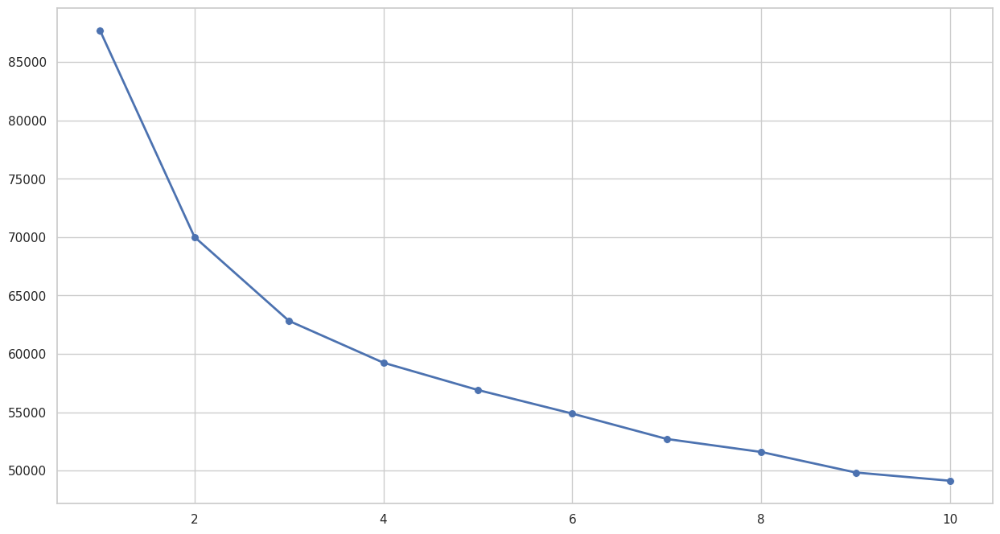

In [210]:
sns.lineplot(x=range(1, 11), y=inertia, linewidth=2)
sns.scatterplot(x=range(1, 11), y=inertia, s=50)

In [211]:
(pd.Series(inertia) - pd.Series(inertia).shift(-1)) / pd.Series(inertia) * 100

0   20.175069
1   10.270573
2    5.706032
3    3.947132
4    3.557188
5    3.960680
6    2.113801
7    3.408473
8    1.420422
9         NaN
dtype: float64

### **Conclusion**

Based on the results of determining the number of clusters with the elbow method, the change does not change significantly in 4 clusters, so it will be divided into 4 clusters.

# K Means Clustering without Dimensionality Reduction

In [212]:
kmeans = KMeans(n_clusters=4, init='k-means++', random_state=0)
kmeans.fit(clus_dfsc)
#Adding the Clusters feature to the orignal dataframe.
clus_df["cluster_km_orig"] = kmeans.labels_
df["cluster_KM_orig"] = kmeans.labels_
# Get the predictions
predictions = kmeans.predict(clus_dfsc)
clus_df.head()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



,Education,Income,Kidhome,Teenhome,Recency,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Age,Age_group,Has_child,Dependents,Lifetime,Spending,Total_Purchases,Total_Cmp,Ever_Accept,Total_revenue,Income_sgmt,Conversion_rate_web,Month_joined,Recency_sgmt,Response,Cerai,Lajang,Menikah,cluster_km_orig
0,1.000000,0.365734,0.000000,0.000000,0.585859,1.051500,1.324828,1.429830,1.552432,1.298176,1.062647,0.747062,1.335345,1.725758,-0.419456,0.350000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.378641,2.000000,0.000000,0.000000,0.771429,1.313280,0.568182,0.000000,0.000000,0.000000,1.000000,0.321583,4.000000,2.000000,1.000000,0.000000,1.000000,0.000000,2
1,1.000000,-0.137976,1.000000,1.000000,0.383838,-1.183662,-0.650001,-1.351599,-0.588001,-0.625354,-0.865322,0.159380,-1.363295,-0.378510,-1.428511,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.407767,2.000000,1.000000,2.000000,0.200000,-1.443495,0.136364,0.000000,0.000000,0.000000,1.000000,-0.862954,8.000000,3.000000,0.000000,0.000000,1.000000,0.000000,3
2,1.000000,0.877869,0.000000,0.000000,0.262626,0.733018,0.957470,0.424657,1.245391,0.495487,0.389482,-0.824092,1.335345,0.154727,1.241906,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.300971,2.000000,0.000000,0.000000,0.542857,0.658297,0.477273,0.000000,0.000000,0.000000,2.000000,0.729316,8.000000,3.000000,0.000000,0.000000,0.000000,1.000000,2
3,1.000000,-1.166848,1.000000,0.000000,0.262626,-1.183662,-0.212388,-0.699631,-0.027449,-0.294167,-0.953176,0.159380,-0.715666,-1.341311,-0.419456,0.300000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.116505,0.000000,1.000000,1.000000,0.257143,-1.116932,0.181818,0.000000,0.000000,0.000000,0.000000,-0.756467,10.000000,3.000000,0.000000,0.000000,0.000000,1.000000,3
4,3.000000,0.371969,1.000000,0.000000,0.949495,0.109151,0.881150,0.376879,0.705400,0.620765,-0.353802,1.445810,0.524119,0.520254,0.273669,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.145631,1.000000,1.000000,1.000000,0.000000,0.176959,0.431818,0.000000,0.000000,0.000000,1.000000,0.389065,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1


In [213]:
#PCA for visualization
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(clus_dfsc)
PCA_ds = pd.DataFrame(pca.transform(clus_dfsc), columns=(["col1","col2"]))
PCA_ds.describe().T

,count,mean,std,min,25%,50%,75%,max
col1,2193.000000,-0.000000,3.272503,-6.860876,-2.944838,-0.134946,2.584373,9.013859
col2,2193.000000,-0.000000,1.990876,-3.308206,-1.605316,-0.076779,0.903289,10.017153


<Axes: xlabel='col1', ylabel='col2'>

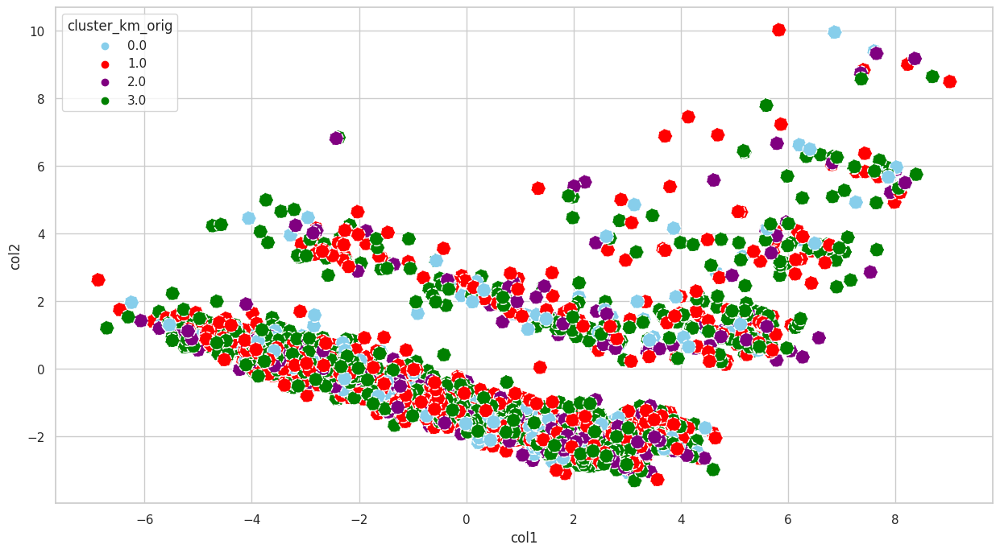

In [214]:
PCA_ds["cluster_km_orig"] = clus_df["cluster_km_orig"].copy()
# Visualize the results in 2D
fig, ax = plt.subplots(figsize=(15,8))

sns.scatterplot(
    x="col1", y="col2",
    hue="cluster_km_orig",
    linestyle='--',
    data=PCA_ds,
    palette=['skyblue','red','purple','green'],
    s=160,
    ax=ax
)

# K Means Clustering with Dimensionality Reduction

In [ ]:
PCA_ds.drop("cluster_km_orig", axis=1, inplace=True)
PCA_ds.head()

In [218]:
#Use PCA for Cluster
kMeans = KMeans(n_clusters = 4, init = 'k-means++', random_state=0)
y_pred_kMeans = kMeans.fit_predict(PCA_ds)
PCA_ds["Cluster_KM_PCA"] = y_pred_kMeans
#Adding the Clusters feature to the orignal dataframe.
clus_df["Cluster_KM_PCA"] = y_pred_kMeans
df["cluster_KM_PCA"] = y_pred_kMeans

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



<Axes: xlabel='col1', ylabel='col2'>

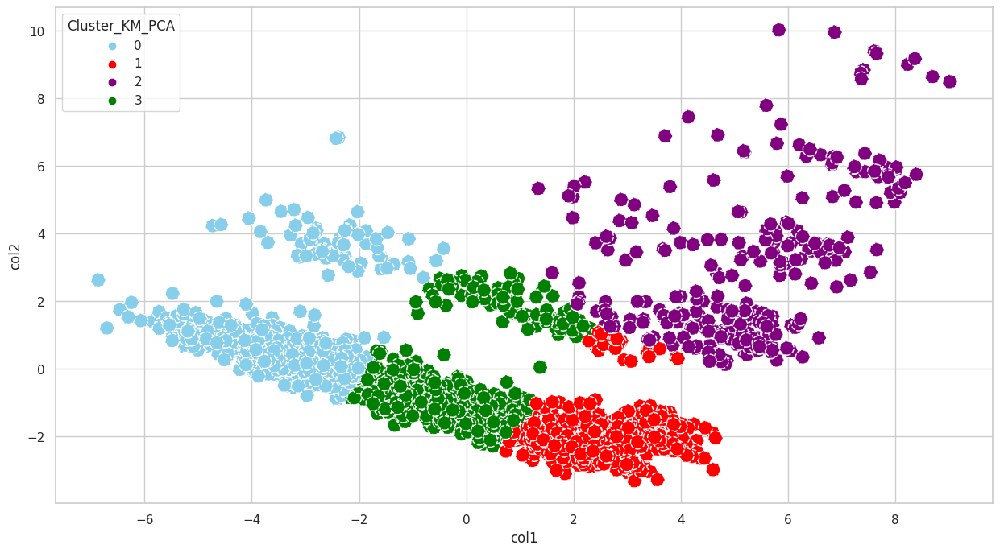

In [219]:
# Visualize the results in 2D
fig, ax = plt.subplots(figsize=(15,8))

sns.scatterplot(
    x="col1", y="col2",
    hue="Cluster_KM_PCA",
    linestyle='--',
    data=PCA_ds,
    palette=['skyblue','red','purple','green'],
    s=160,
    ax=ax
)

# SILHOUETTE PLOT

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



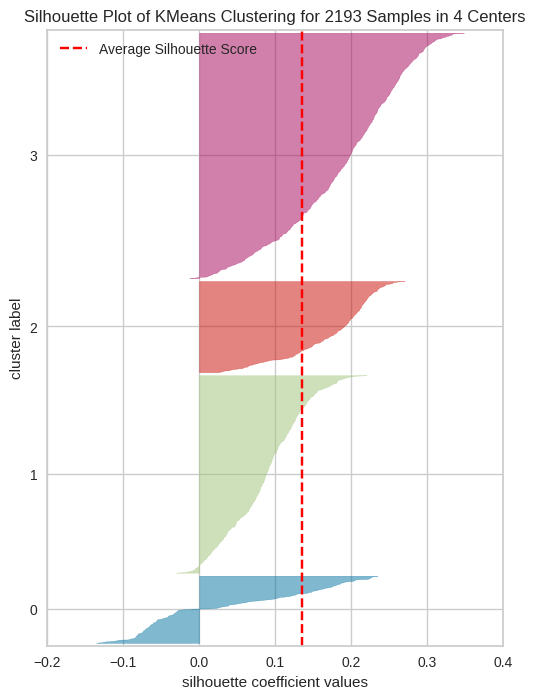

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



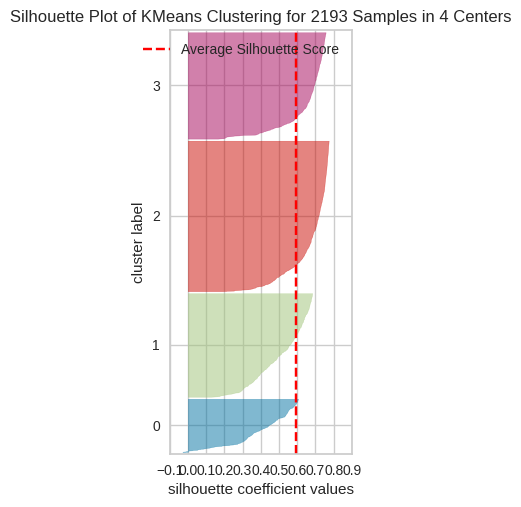

In [222]:
from yellowbrick.cluster import SilhouetteVisualizer
plt.figure(figsize=[20,8])

#silhoutte plot Kmeans without PCA
plt.subplot(1,3,1)
model = KMeans(n_clusters=4, random_state=0)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(clus_dfsc)
visualizer.show()
plt.show()

#silhoutte plot Kmeans with PCA
plt.subplot(1,3,2)
model = KMeans(n_clusters=4, random_state=0)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(PCA_ds)
visualizer.show()
plt.show()

# CLUSTERING WITH RFM ANALYSIS